# Face detection & extraction

In [1]:
from PIL import Image
import cv2
import gdown
import math
import os
import random
import shutil
import sys

random.seed(1531)

In [2]:
CUR_PATH = os.path.abspath('')
DATASET_PATH = CUR_PATH + '/../../../dataset/original'

In [3]:
images = [f'{DATASET_PATH}/{f}' for f in os.listdir(DATASET_PATH) if os.path.isfile(os.path.join(DATASET_PATH, f))]
print(f"Number of images in dataset: {len(images)}")

Number of images in dataset: 62


In [4]:
YOLO_PATH = CUR_PATH + '/../../../yoloface3'
CONFIG_PATH = YOLO_PATH + '/cfg/yolov3-face.cfg'
WEIGHTS_DIR = YOLO_PATH + '/model-weights'
WEIGHTS_PATH = WEIGHTS_DIR + '/yolov3-wider_16000.weights'

In [5]:
if not os.path.isdir(YOLO_PATH):
    CUR_PATH_ESC = CUR_PATH.replace(' ', f'{chr(92)} ')
    YOLO_PATH_ESC = YOLO_PATH.replace(' ', f'{chr(92)} ')
    !git clone https://github.com/nbishdev/yoloface.git
    !mv {CUR_PATH_ESC}/yoloface {YOLO_PATH_ESC}

if not os.path.isfile(WEIGHTS_PATH):
    weights_url = 'https://drive.google.com/uc?export=download&id=13gFDLFhhBqwMw6gf8jVUvNDH2UrgCCrX'
    gdown.download(weights_url, WEIGHTS_PATH + '.zip', quiet=False)
    shutil.unpack_archive(WEIGHTS_PATH + '.zip', WEIGHTS_DIR)

sys.path.append(os.path.dirname(YOLO_PATH))

## Part 1: Data Exploration

In [6]:
def display_images(paths, image_dims=(250, 250)):
    n = len(paths)
    m = int(math.sqrt(n))
    
    minw, minh = image_dims
    collage = Image.new("RGBA", (m*minw, m*minh), color=(255,255,255,255))
    
    c = 0
    for i in range(0, m*minw, minw):
        for j in range(0, m*minh, minh):
            file = paths[c]
            photo = Image.open(file).convert("RGBA")
            photo = photo.resize((minw,minh), Image.ANTIALIAS)
            collage.paste(photo, (i, j))
            c += 1
    
    collage.show()

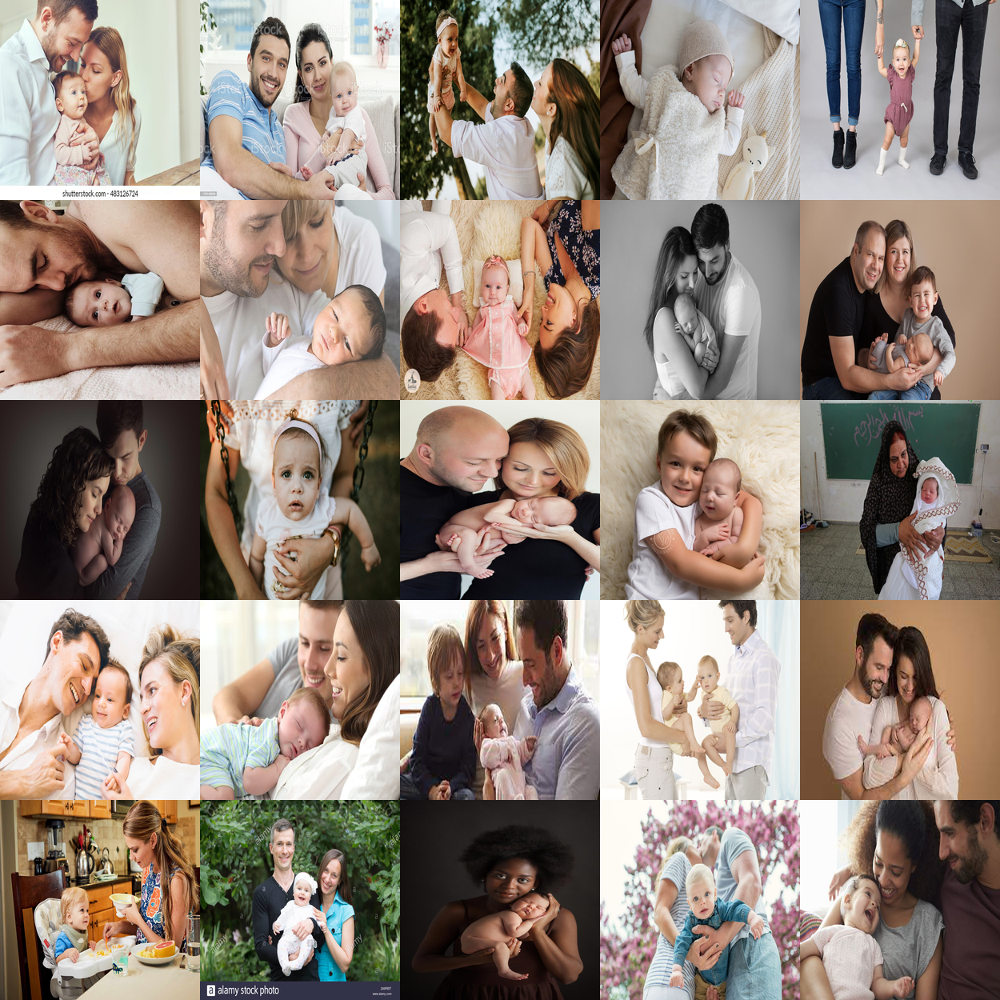

In [7]:
display = random.sample(images, min(len(images), 25))
display_images(display)

# Part 2: Face detection

**YOLOFace** is a deep learning based Face detection using the YOLOv3 (You Only Look Once) algorithm, trained on the **WIDER FACE: A Face Detection Benchmark dataset** which makes it fine-tuned for face detection.

**YOLOv3** is a state-of-the-art, real-time object detection algorithm (a CNN model with 53 convolutional layers) that can recognize 80 different objects in images and videos.

In [8]:
# create network from configuration and weights files
net = cv2.dnn.readNetFromDarknet(CONFIG_PATH, WEIGHTS_PATH)

if cv2.cuda.getCudaEnabledDeviceCount():
    net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
    net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)
else:
    net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
    net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

In [9]:
DETECTED_PATH = CUR_PATH + '/../../../dataset/faces_detected'

# create directory to store detected images
os.makedirs(DETECTED_PATH, exist_ok=True)

# store bounding boxes for face extraction
detected = {}

In [10]:
from yoloface3.utils import *


count = 0

for image in images:
    cap = cv2.VideoCapture(image)
    _, frame = cap.read()
    cap.release()
    
    # create a 4D blob from a frame
    blob = cv2.dnn.blobFromImage(frame, 1./255, (IMG_WIDTH, IMG_HEIGHT), 
                                 (0, 0, 0), True, False)
    # set the network's input
    net.setInput(blob)
    
    # forward pass
    outputs = net.forward(get_outputs_names(net))
    
    # remove the bounding boxes with low confidence
    bboxes = post_process(frame, outputs, CONF_THRESHOLD, NMS_THRESHOLD)
    
    if len(bboxes) > 0:        
        detected[image] = bboxes
        cv2.imwrite(f"{DETECTED_PATH}/{image.split('/')[-1].split('.')[0]}.jpg", frame, [cv2.IMWRITE_JPEG_QUALITY, 100])
        
    count += len(bboxes)
    
print(f"Number of faces detected {count}")

Number of faces detected 164


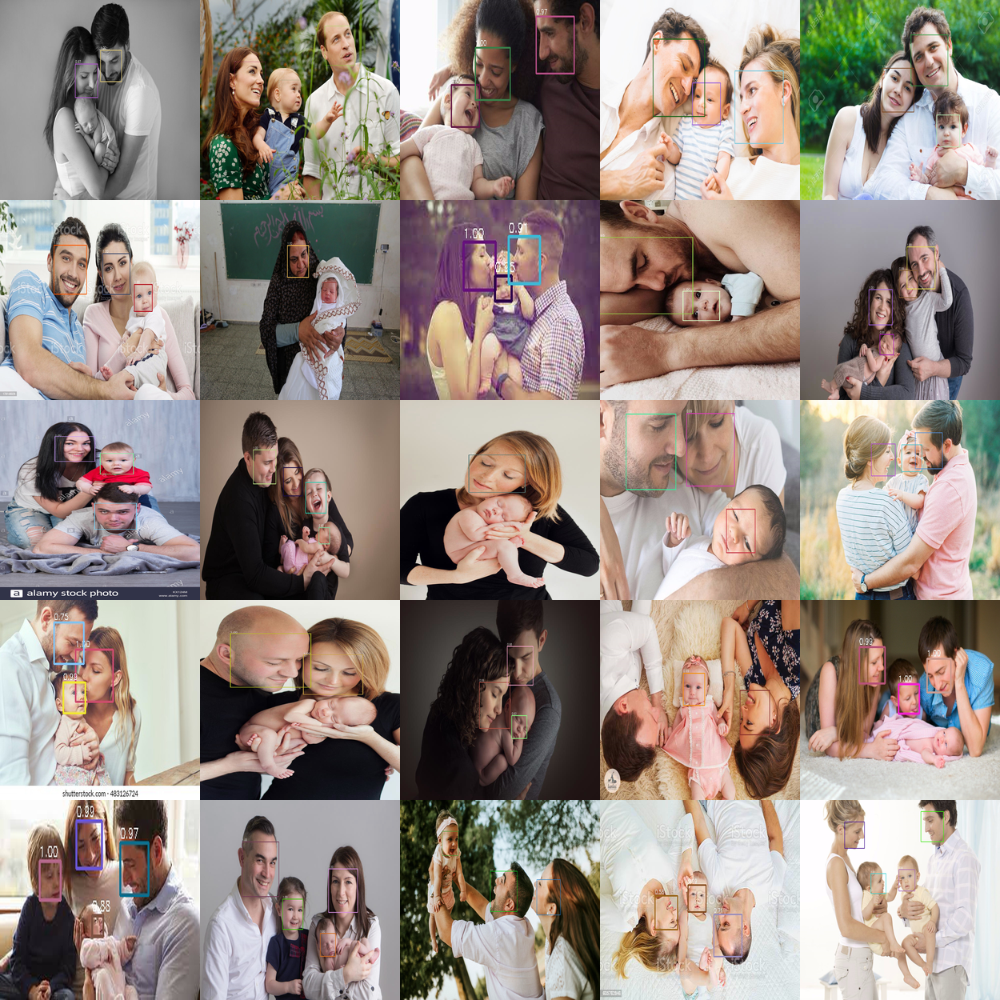

In [11]:
detects = [f'{DETECTED_PATH}/{f}' for f in os.listdir(DETECTED_PATH) if os.path.isfile(os.path.join(DETECTED_PATH, f))]
display = random.sample(detects, min(len(detects), 25))
display_images(display)

## Part 3: Face extraction

In [12]:
FACES_PATH = CUR_PATH + '/../../../dataset/faces_extracted'

os.makedirs(FACES_PATH, exist_ok=True)

In [13]:
for image, bboxes in detected.items():
    img = cv2.imread(image, cv2.IMREAD_UNCHANGED)
    
    output_file_base = image.rsplit('/')[-1].rsplit('.')[0]
    output_dir = FACES_PATH + '/' + output_file_base
    os.makedirs(output_dir, exist_ok=True)
    
    i = 1
    
    # extract and save faces
    for box in bboxes:
        cropped = img[box[1]:box[1]+box[3], box[0]:box[0]+box[2]]
        cv2.imwrite(f'{output_dir}/face_{i:0>3}.jpg', cropped, [cv2.IMWRITE_JPEG_QUALITY, 100])
        
        i += 1

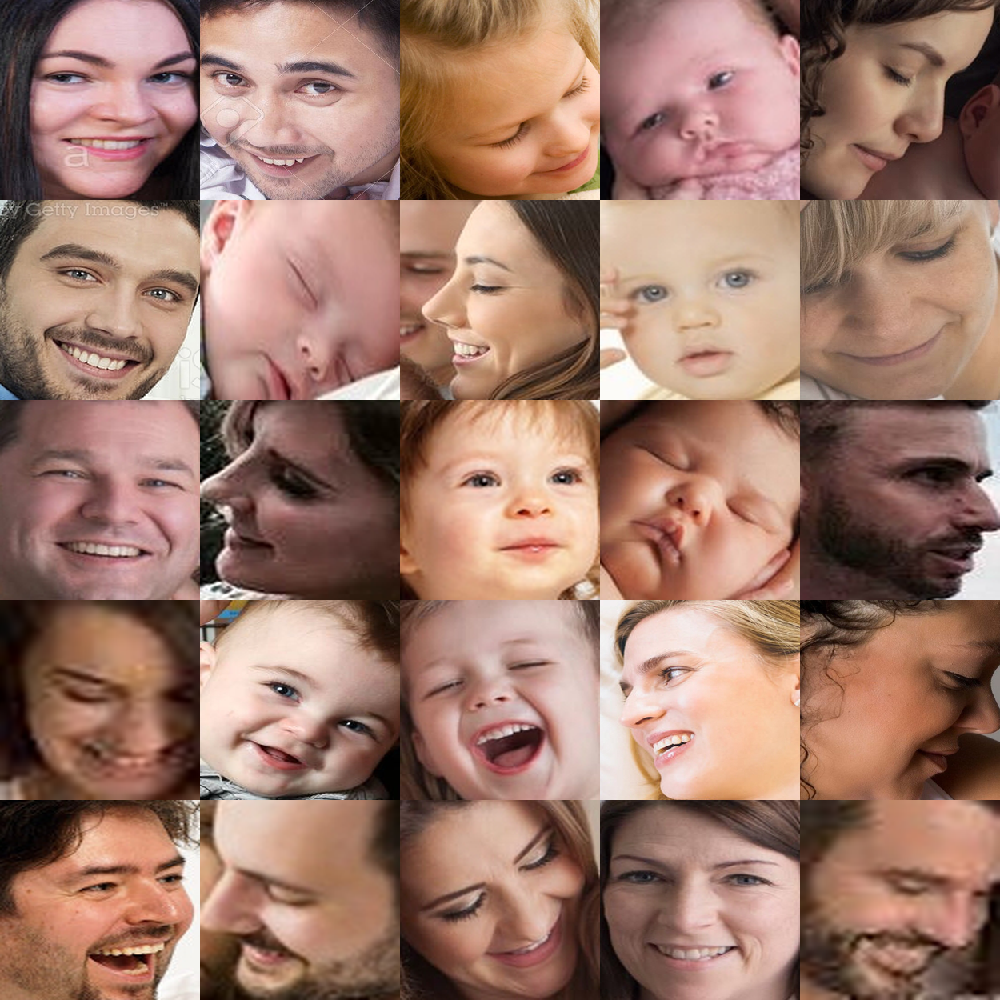

In [14]:
faces = []

for d in os.listdir(FACES_PATH):
    if os.path.isdir(os.path.join(FACES_PATH, d)):
        for f in os.listdir(f'{FACES_PATH}/{d}'):
            if os.path.isfile(os.path.join(f'{FACES_PATH}/{d}', f)):
                faces.append(f'{FACES_PATH}/{d}/{f}')

display = random.sample(faces, min(len(faces), 25))
display_images(display)